In [20]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [21]:
import h5py, os, tqdm, glob
import numpy as np
import matplotlib.pyplot as plt
from functools import partial

os.environ["JAX_PLATFORM_NAME"] = "cpu"
import jax
import jax.numpy as jnp
import jax_cosmo as jc

import optax
from flax import nnx
import orbax.checkpoint as ocp

import diffrax
from diffrax import diffeqsolve, ODETerm, Dopri5, LeapfrogMidpoint, PIDController, SaveAt, ConstantStepSize
from jax.experimental.ode import odeint

import jaxpm
from jaxpm.painting import cic_paint, cic_read
from jaxpm.pm import linear_field, lpt, make_ode_fn, pm_forces, make_ode_fn_diffrax, make_ode_fn
from jaxpm.kernels import fftk, gradient_kernel, invlaplace_kernel, longrange_kernel, invnabla_kernel
from jaxpm import camels, plotting, hpm, pm, nn

jax.devices()

[CpuDevice(id=0)]

# CAMELS nbody

In [22]:
CAMELS = "/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims"
CODE = "SIMBA"
SIMSET = "CV/CV_0"
CV = os.path.join(CAMELS, CODE + "_DM", SIMSET)

i_snapshots = range(1, 33+8, 8)

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]


dark matter only
dark matter only
dark matter only


100%|██████████| 5/5 [00:01<00:00,  4.61it/s]


Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]


dark matter only
dark matter only
dark matter only


100%|██████████| 5/5 [00:01<00:00,  2.86it/s]


Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:12<00:00,  2.57s/it]


dark matter only
dark matter only
dark matter only


100%|██████████| 5/5 [00:05<00:00,  1.15s/it]


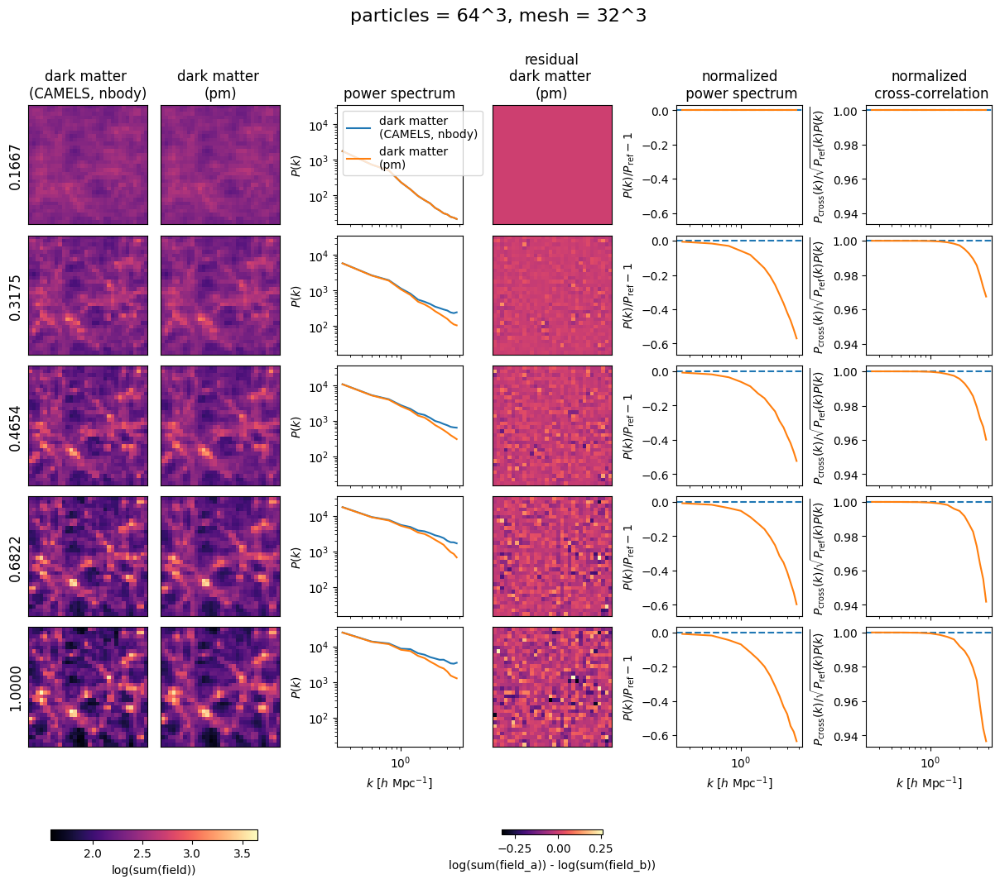

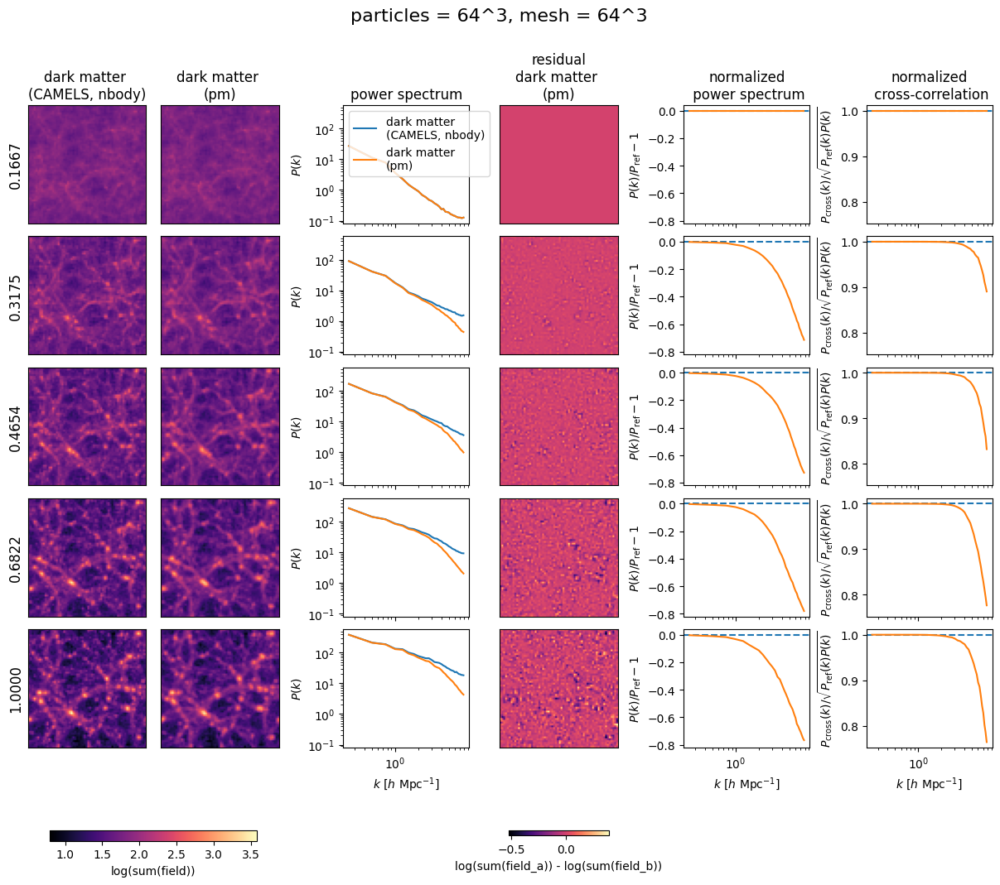

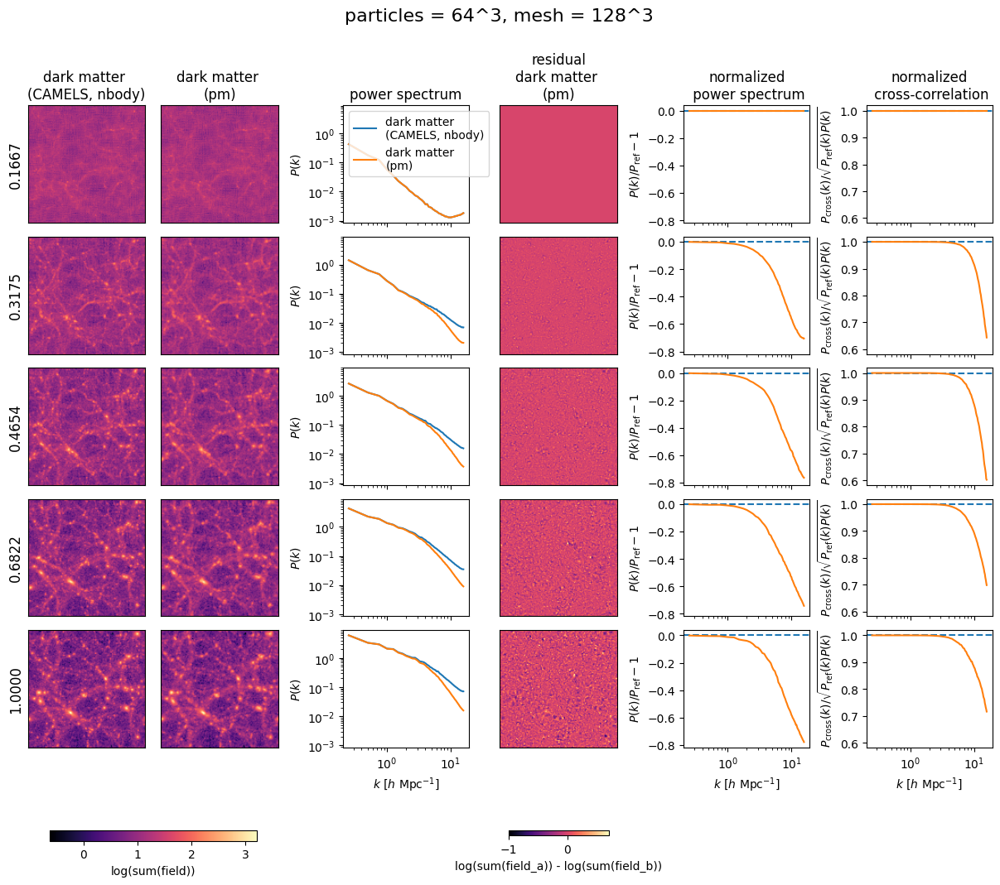

In [25]:
# for parts_per_dim, mesh_per_dim in zip([64, 128], [64, 128]):
# for parts_per_dim, mesh_per_dim in zip([64, 64, 64, 64], [32, 64, 128, 256]):
for parts_per_dim, mesh_per_dim in zip([64, 64, 64], [32, 64, 128]):
# for parts_per_dim, mesh_per_dim in zip([32, 64, 128], [64, 64, 64]):
    mesh_shape = [mesh_per_dim] * 3
    
    if parts_per_dim == 256:
        parts_per_dim = None
    
    nbody_dict = camels.load_CV_snapshots(
        CV,
        mesh_per_dim,
        parts_per_dim,
        i_snapshots=i_snapshots,
        return_hydro=False
    )
    
    cosmo = nbody_dict["cosmo"]
    scales = nbody_dict["scales"]
    
    n_dm_poss = nbody_dict["dm_poss"]
    n_dm_vels = nbody_dict["dm_vels"]

    pm_ode = hpm.get_extended_hpm_network_ode_fn(
        mesh_per_dim, cosmo, dm_model=None, gas_model=None, integrator_type="diffrax"
    )

    res = diffeqsolve(
            terms=ODETerm(pm_ode),
            solver=LeapfrogMidpoint(),
            t0=scales[0],
            t1=scales[-1],
            dt0=0.01,
            y0=(n_dm_poss[0], n_dm_vels[0]),
            saveat=SaveAt(ts=scales),
            max_steps=100,
            stepsize_controller=ConstantStepSize(),
    )
    res = res.ys
    
    pm_dm_poss, pm_dm_vels = res

    plotting.compare_particle_evolution(
        mesh_shape,
        scales,
        jnp.stack([n_dm_poss, pm_dm_poss], axis=0),
        include_pk=True,
        include_reference=True,
        # values
        shared_colorbar=True,
        # cosmetics
        title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
        col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(pm)"],
    )

# TRASH

In [15]:
CAMELS = "/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims"
CODE = "SIMBA"
SIMSET = "CV/CV_0"
CV = os.path.join(CAMELS, CODE, SIMSET)

i_snapshots = range(1, 33+8, 8)

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)
Selecting 262144 gas particles (random)


finding unique gas particle indices:  20%|██        | 1/5 [00:01<00:04,  1.19s/it]

Found 368 duplicate gas particle IDs


finding unique gas particle indices:  40%|████      | 2/5 [00:06<00:11,  3.72s/it]

Found 4088 duplicate gas particle IDs


finding unique gas particle indices:  60%|██████    | 3/5 [00:12<00:09,  4.56s/it]

Found 9025 duplicate gas particle IDs


finding unique gas particle indices:  80%|████████  | 4/5 [00:17<00:04,  4.87s/it]

Found 14787 duplicate gas particle IDs


finding unique gas particle indices: 100%|██████████| 5/5 [00:22<00:00,  4.59s/it]


There are 15915410 (94.86%) gas particles that exist in all snapshots


loading snapshots: 100%|██████████| 5/5 [01:43<00:00, 20.65s/it]


dark matter and gas
dark matter and gas
dark matter and gas


100%|██████████| 5/5 [00:01<00:00,  4.94it/s]


Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)
Selecting 262144 gas particles (random)


finding unique gas particle indices:  20%|██        | 1/5 [00:01<00:05,  1.30s/it]

Found 368 duplicate gas particle IDs


finding unique gas particle indices:  40%|████      | 2/5 [00:06<00:11,  3.85s/it]

Found 4088 duplicate gas particle IDs


finding unique gas particle indices:  60%|██████    | 3/5 [00:12<00:09,  4.65s/it]

Found 9025 duplicate gas particle IDs


finding unique gas particle indices:  80%|████████  | 4/5 [00:17<00:04,  4.84s/it]

Found 14787 duplicate gas particle IDs


finding unique gas particle indices: 100%|██████████| 5/5 [00:22<00:00,  4.56s/it]


There are 15915410 (94.86%) gas particles that exist in all snapshots


loading snapshots: 100%|██████████| 5/5 [01:44<00:00, 20.82s/it]


dark matter and gas
dark matter and gas
dark matter and gas


100%|██████████| 5/5 [00:01<00:00,  2.85it/s]


Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)
Selecting 262144 gas particles (random)


finding unique gas particle indices:  20%|██        | 1/5 [00:01<00:04,  1.18s/it]

Found 368 duplicate gas particle IDs


finding unique gas particle indices:  40%|████      | 2/5 [00:06<00:11,  3.78s/it]

Found 4088 duplicate gas particle IDs


finding unique gas particle indices:  60%|██████    | 3/5 [00:12<00:09,  4.54s/it]

Found 9025 duplicate gas particle IDs


finding unique gas particle indices:  80%|████████  | 4/5 [00:17<00:04,  4.77s/it]

Found 14787 duplicate gas particle IDs


finding unique gas particle indices: 100%|██████████| 5/5 [00:22<00:00,  4.48s/it]


There are 15915410 (94.86%) gas particles that exist in all snapshots


loading snapshots: 100%|██████████| 5/5 [01:37<00:00, 19.48s/it]


dark matter and gas
dark matter and gas
dark matter and gas


100%|██████████| 5/5 [00:05<00:00,  1.19s/it]


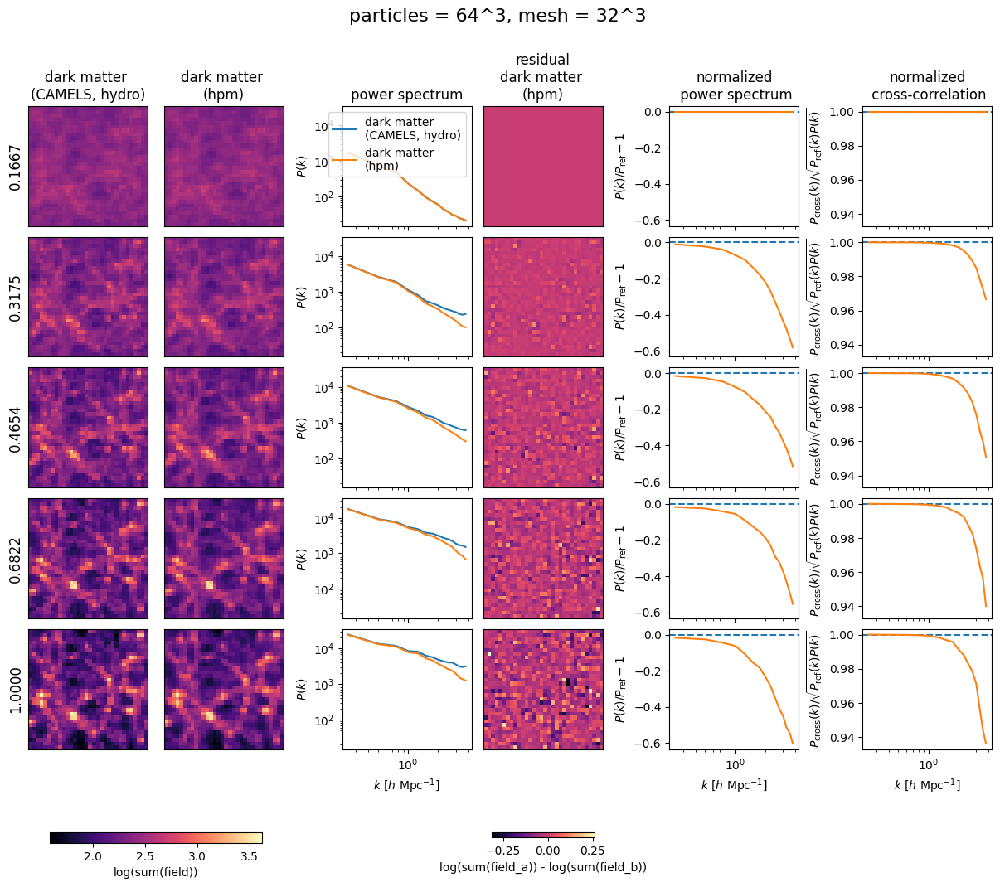

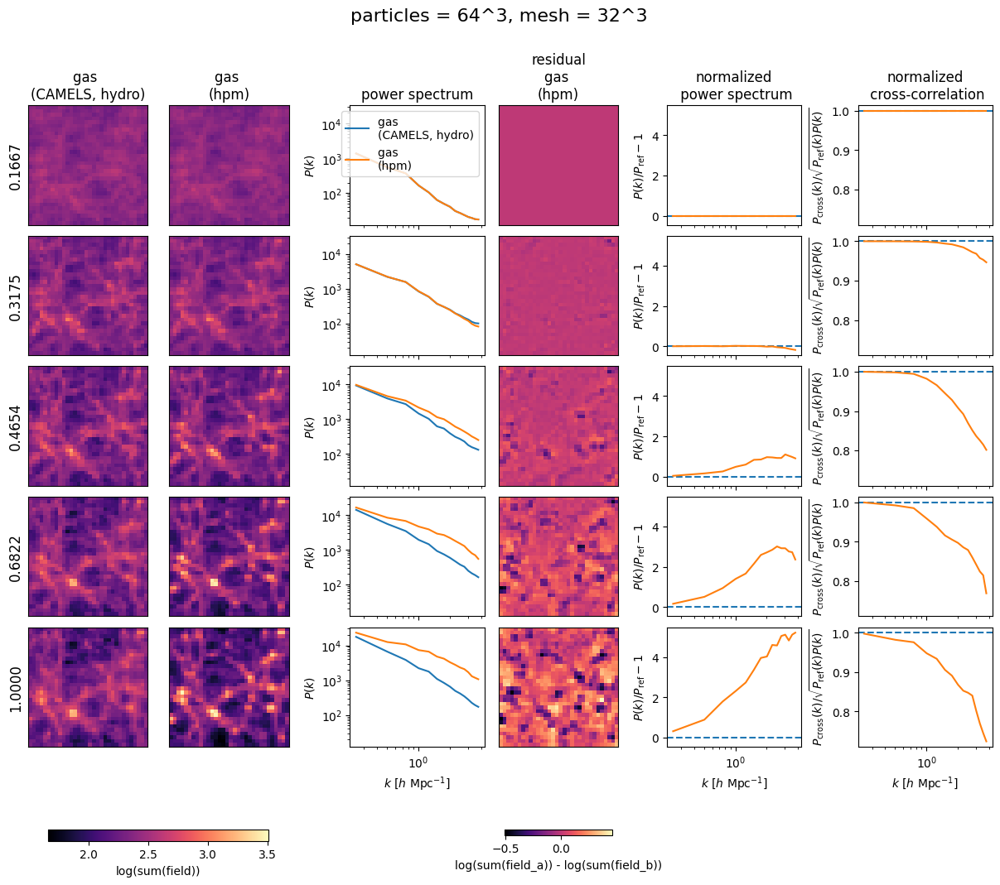

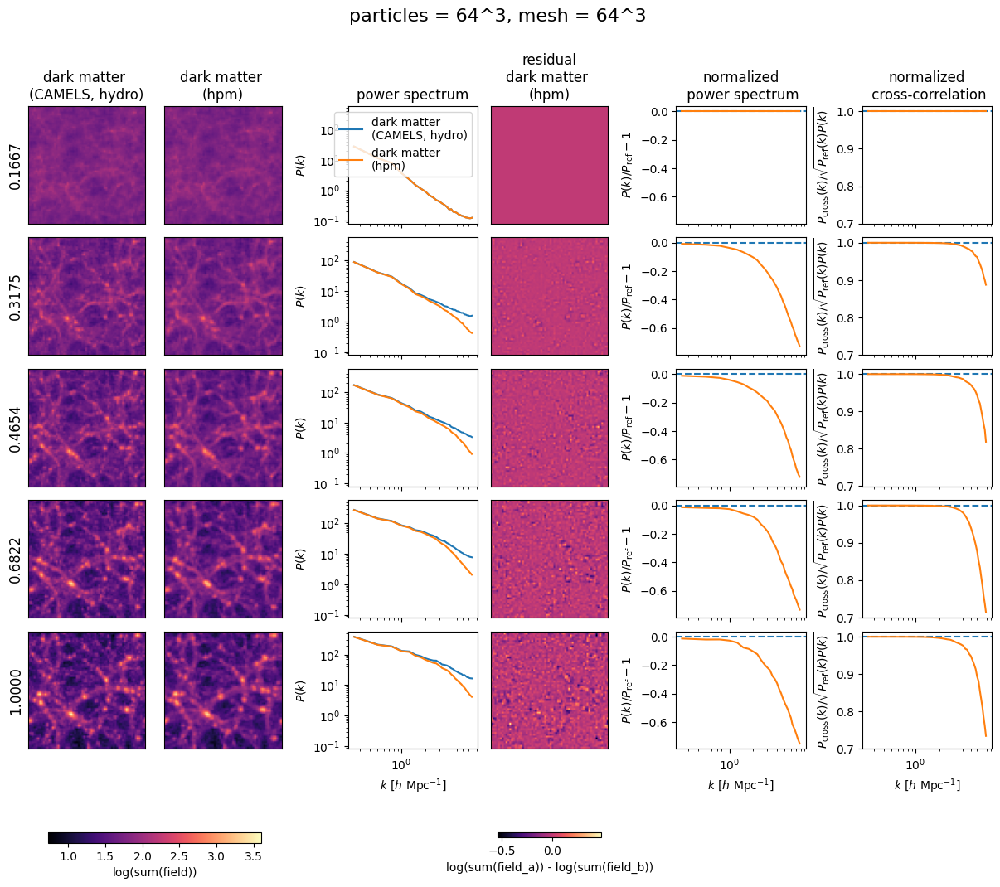

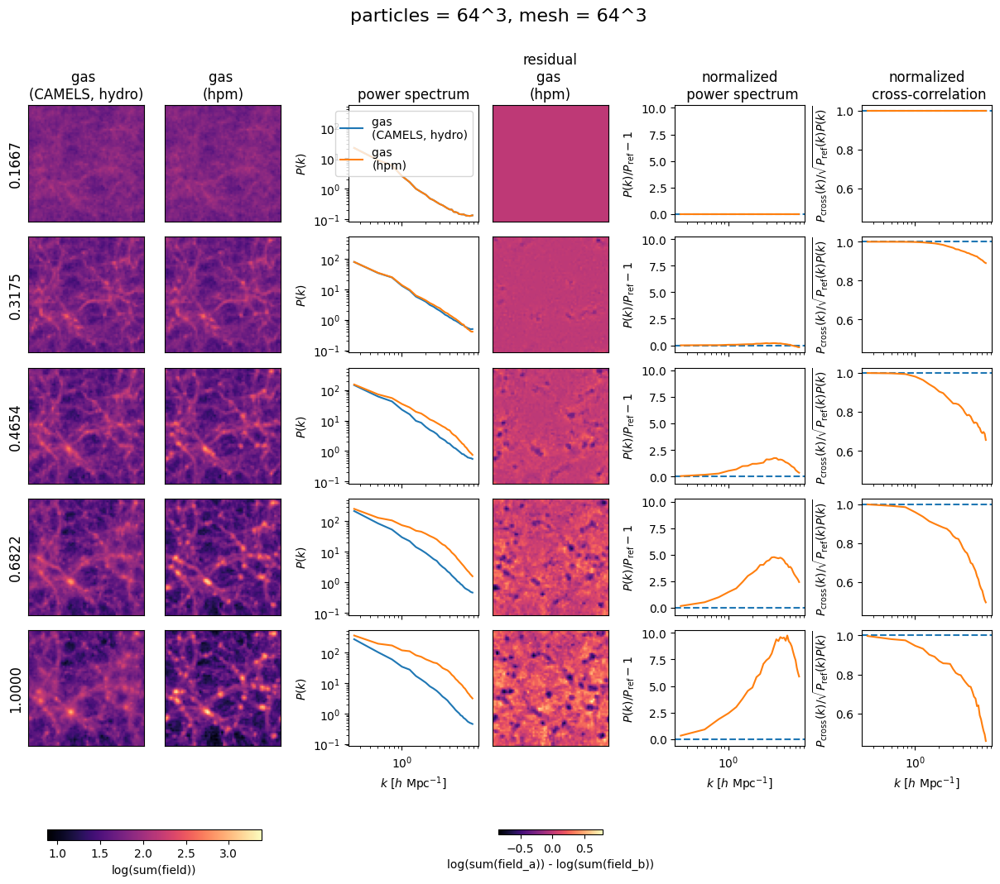

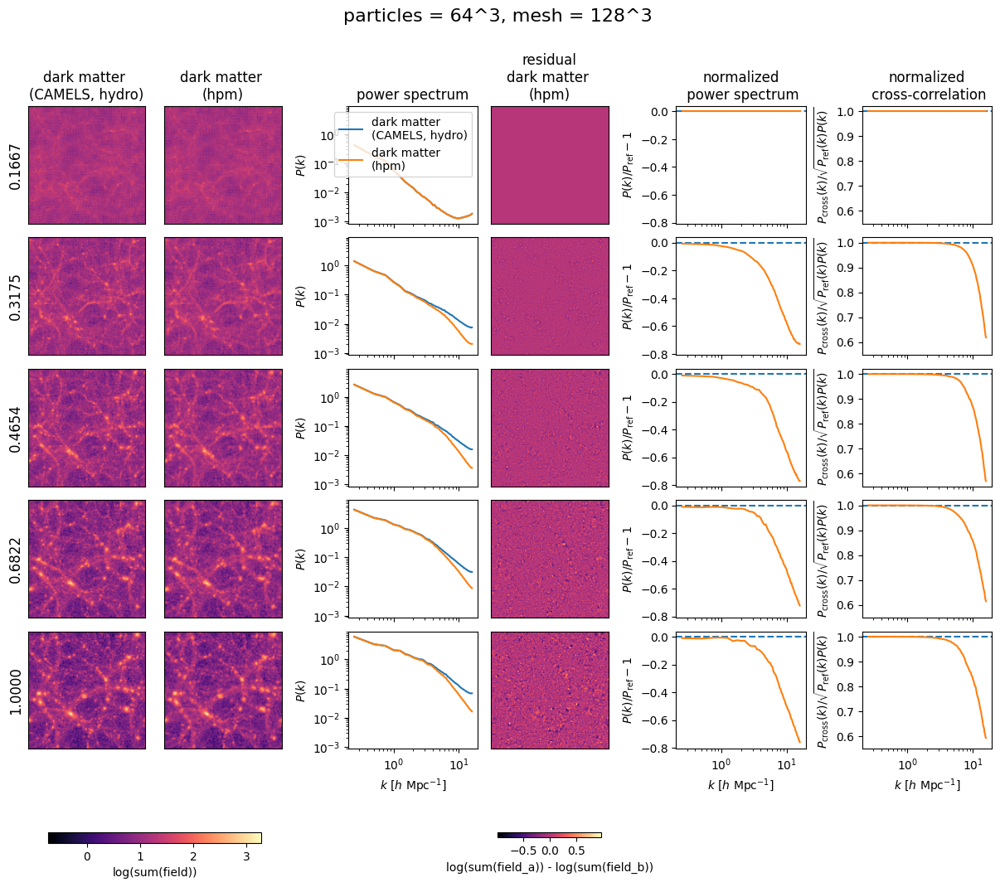

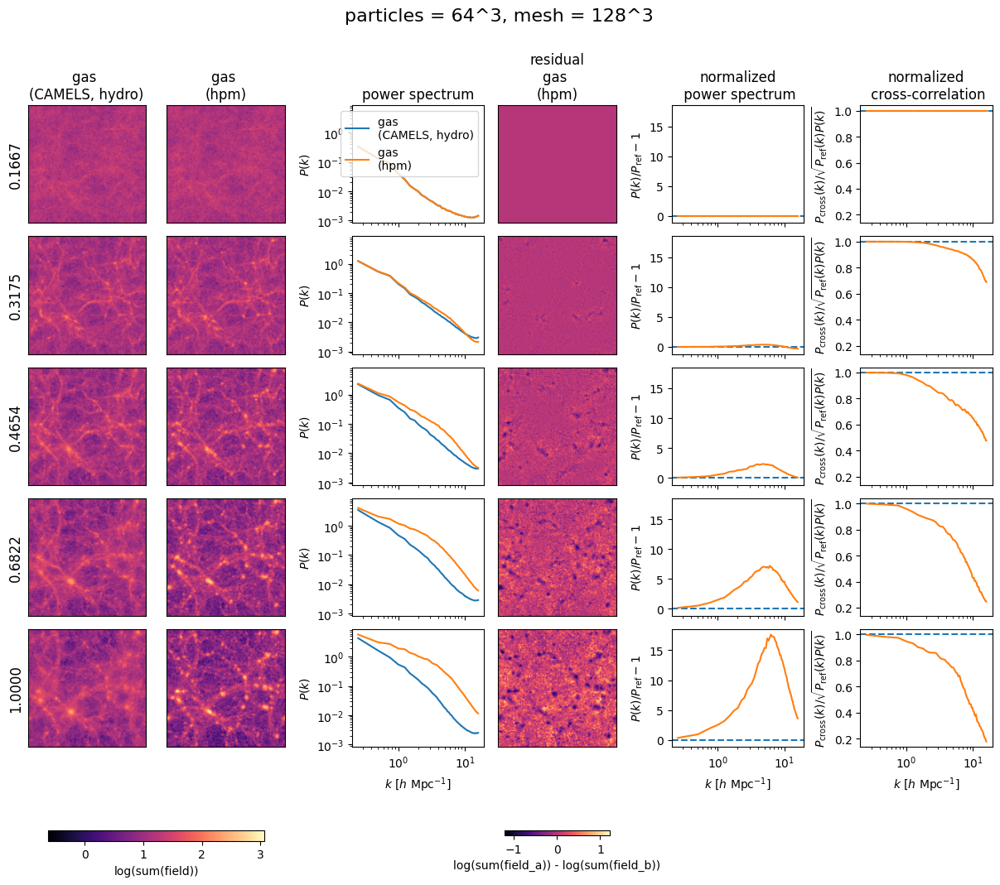

In [19]:
# for parts_per_dim, mesh_per_dim in zip([64, 128], [64, 128]):
for parts_per_dim, mesh_per_dim in zip([64, 64, 64], [32, 64, 128]):
# for parts_per_dim, mesh_per_dim in zip([32, 64, 128], [64, 64, 64]):
    mesh_shape = [mesh_per_dim] * 3
    
    if parts_per_dim == 256:
        parts_per_dim = None
    
    hydro_dict = camels.load_CV_snapshots(
        CV,
        mesh_per_dim,
        parts_per_dim,
        i_snapshots=i_snapshots,
        return_hydro=True,
    )
    
    cosmo = hydro_dict["cosmo"]
    scales = hydro_dict["scales"]
    
    h_dm_poss = hydro_dict["dm_poss"]
    h_dm_vels = hydro_dict["dm_vels"]
    h_gas_poss = hydro_dict["gas_poss"]
    h_gas_vels = hydro_dict["gas_vels"]

    hpm_ode = hpm.get_extended_hpm_network_ode_fn(
        cosmo, mesh_per_dim, parts_per_dim, dm_model=None, gas_model=None, integrator_type="diffrax"
    )

    res = diffeqsolve(
            terms=ODETerm(hpm_ode),
            solver=LeapfrogMidpoint(),
            t0=scales[0],
            t1=scales[-1],
            dt0=0.01,
            y0=(h_dm_poss[0], h_dm_vels[0], h_gas_poss[0], h_gas_vels[0]),
            saveat=SaveAt(ts=scales),
            max_steps=100,
            stepsize_controller=ConstantStepSize(),
    )
    res = res.ys
    
    hpm_dm_poss, hpm_dm_vels, hpm_gas_poss, hpm_gas_vels = res

    plotting.compare_particle_evolution(
        mesh_shape,
        scales,
        jnp.stack([h_dm_poss, hpm_dm_poss], axis=0),
        include_pk=True,
        include_reference=True,
        # values
        shared_colorbar=True,
        # cosmetics
        title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
        col_titles=["dark matter \n(CAMELS, hydro)", "dark matter \n(hpm)"],
    )

    plotting.compare_particle_evolution(
        mesh_shape,
        scales,
        jnp.stack([h_gas_poss, hpm_gas_poss], axis=0),
        include_pk=True,
        include_reference=True,
        # values
        shared_colorbar=True,
        # cosmetics
        title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
        col_titles=["gas \n(CAMELS, hydro)", "gas \n(hpm)"],
    )

### mesh size and particle count

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


100%|██████████| 5/5 [00:02<00:00,  2.28it/s]


Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 2097152 dark matter (deterministic)


100%|██████████| 5/5 [00:06<00:00,  1.30s/it]


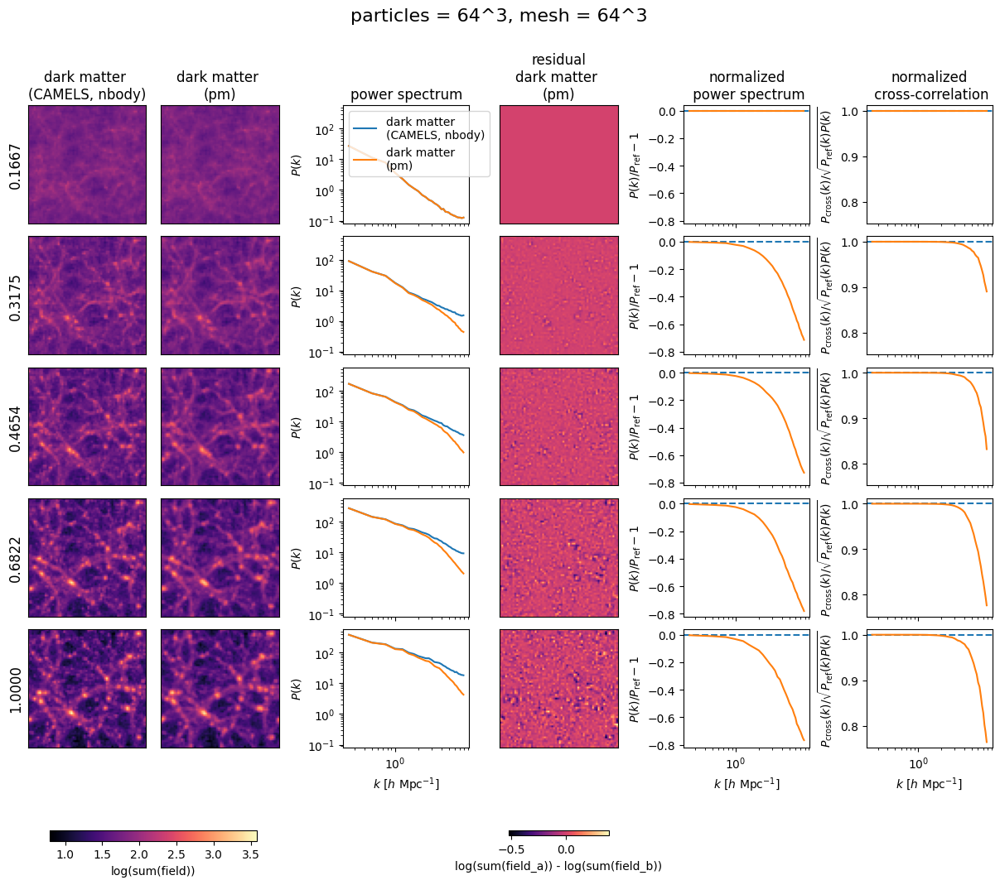

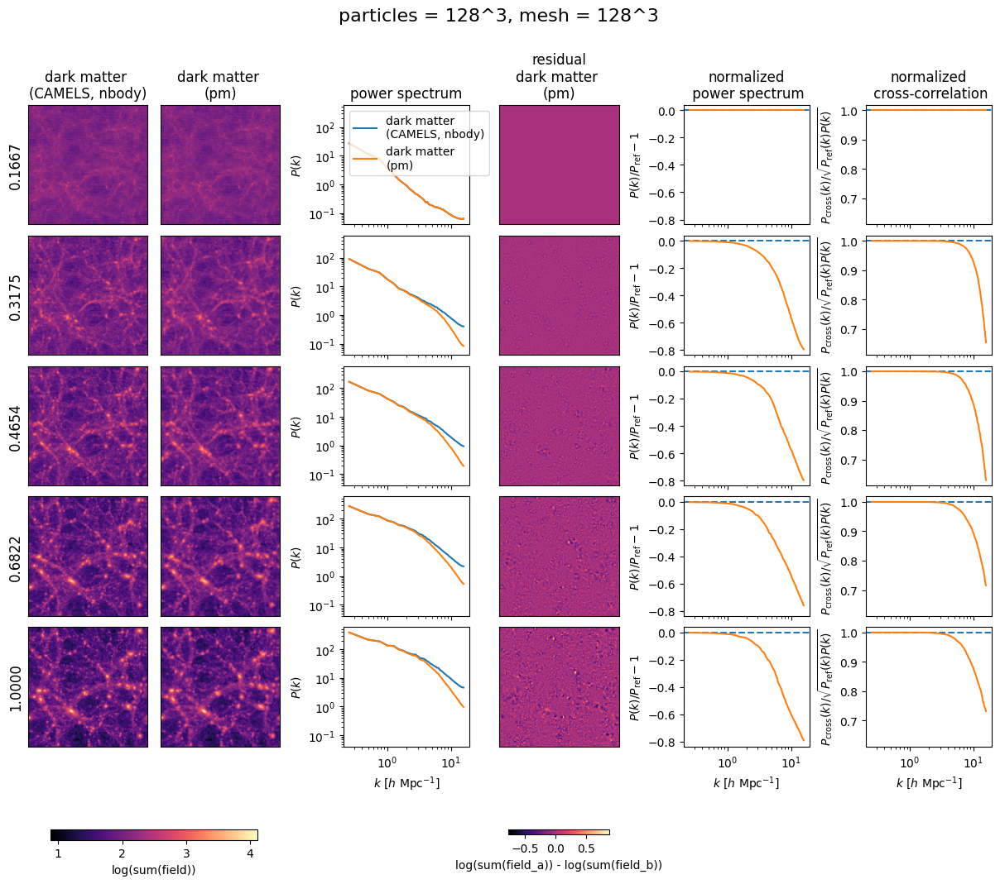

In [4]:
for parts_per_dim in [64, 128]:
# for parts_per_dim in [256]:
    mesh_per_dim = parts_per_dim
    mesh_shape = [mesh_per_dim] * 3
    
    if parts_per_dim == 256:
        parts_per_dim = None
    
    nbody_dict = camels.load_CV_snapshots(
        CV,
        mesh_per_dim,
        parts_per_dim,
        i_snapshots=i_snapshots,
        return_hydro=False
    )
    
    cosmo = nbody_dict["cosmo"]
    scales = nbody_dict["scales"]
    
    n_dm_poss = nbody_dict["dm_poss"]
    n_dm_vels = nbody_dict["dm_vels"]

    pm_ode = pm.make_ode_fn_diffrax(cosmo, mesh_shape)
    
    res = diffeqsolve(
            terms=ODETerm(pm_ode),
            solver=LeapfrogMidpoint(),
            t0=scales[0],
            t1=scales[-1],
            dt0=0.01,
            y0=jnp.stack([n_dm_poss[0], n_dm_vels[0]]),
            saveat=SaveAt(ts=scales),
            max_steps=100,
            stepsize_controller=ConstantStepSize(),
    )
    res = res.ys
    res = jnp.transpose(res, (1,0,2,3))
    
    pm_dm_poss, pm_dm_vels = res

    plotting.compare_particle_evolution(
        mesh_shape,
        scales,
        jnp.stack([n_dm_poss, pm_dm_poss], axis=0),
        include_pk=True,
        include_reference=True,
        # values
        shared_colorbar=True,
        # cosmetics
        title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
        col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(pm)"],
    )

### mesh size

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


100%|██████████| 5/5 [00:01<00:00,  4.86it/s]


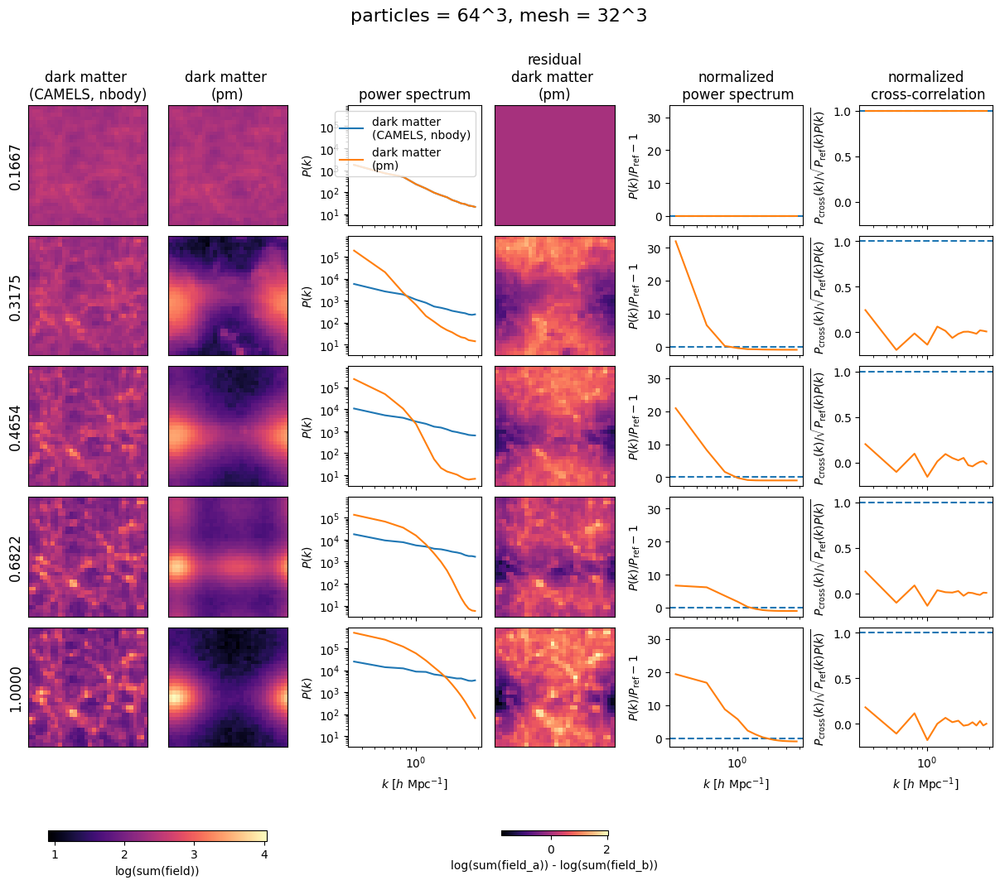

In [30]:
parts_per_dim = 64
# for mesh_per_dim in [64, 128, 256]:
# for mesh_per_dim in [32, 64, 128]:
for mesh_per_dim in [32]:
    mesh_shape = [mesh_per_dim] * 3
    
    if parts_per_dim == 256:
        parts_per_dim = None
    
    nbody_dict = camels.load_CV_snapshots(
        CV,
        mesh_per_dim,
        parts_per_dim,
        i_snapshots=i_snapshots,
        return_hydro=False
    )
    
    cosmo = nbody_dict["cosmo"]
    scales = nbody_dict["scales"]
    
    n_dm_poss = nbody_dict["dm_poss"]
    n_dm_vels = nbody_dict["dm_vels"]

    pm_ode = pm.make_ode_fn_diffrax(cosmo, mesh_shape)
    
    res = diffeqsolve(
            terms=ODETerm(pm_ode),
            solver=LeapfrogMidpoint(),
            t0=scales[0],
            t1=scales[-1],
            dt0=0.01,
            y0=jnp.stack([n_dm_poss[0], n_dm_vels[0]]),
            saveat=SaveAt(ts=scales),
            max_steps=100,
            stepsize_controller=ConstantStepSize(),
    )
    res = res.ys
    res = jnp.transpose(res, (1,0,2,3))
    
    pm_dm_poss, pm_dm_vels = res

    plotting.compare_particle_evolution(
        mesh_shape,
        scales,
        jnp.stack([n_dm_poss, pm_dm_poss], axis=0),
        include_pk=True,
        include_reference=True,
        # values
        shared_colorbar=True,
        # cosmetics
        title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
        col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(pm)"],
    )

    # plotting.compare_particle_evolution(
    #     mesh_shape,
    #     scales,
    #     jnp.stack([n_dm_poss, n_dm_poss], axis=0),
    #     include_pk=True,
    #     include_reference=False,
    #     # values
    #     shared_colorbar=True,
    #     # cosmetics
    #     title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
    #     col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(CAMELS, nbody)"],
    # )

### particle count

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


100%|██████████| 5/5 [00:01<00:00,  2.77it/s]


Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 2097152 dark matter (deterministic)


100%|██████████| 5/5 [00:01<00:00,  2.76it/s]


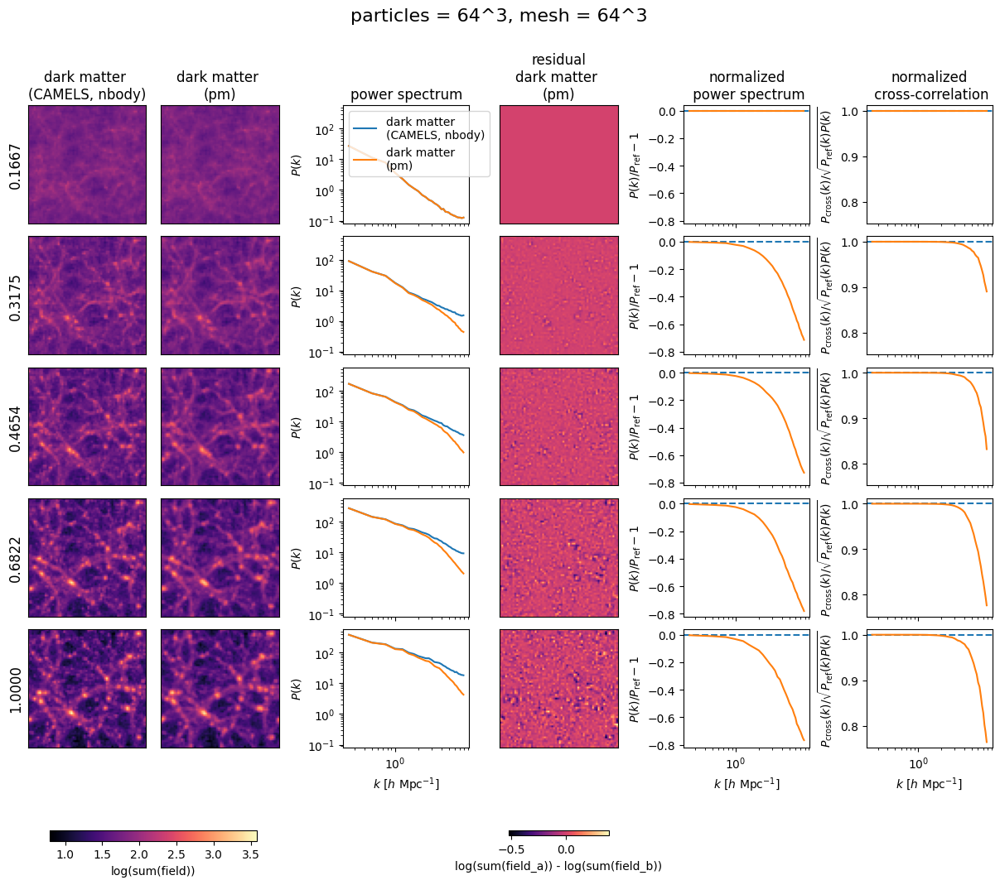

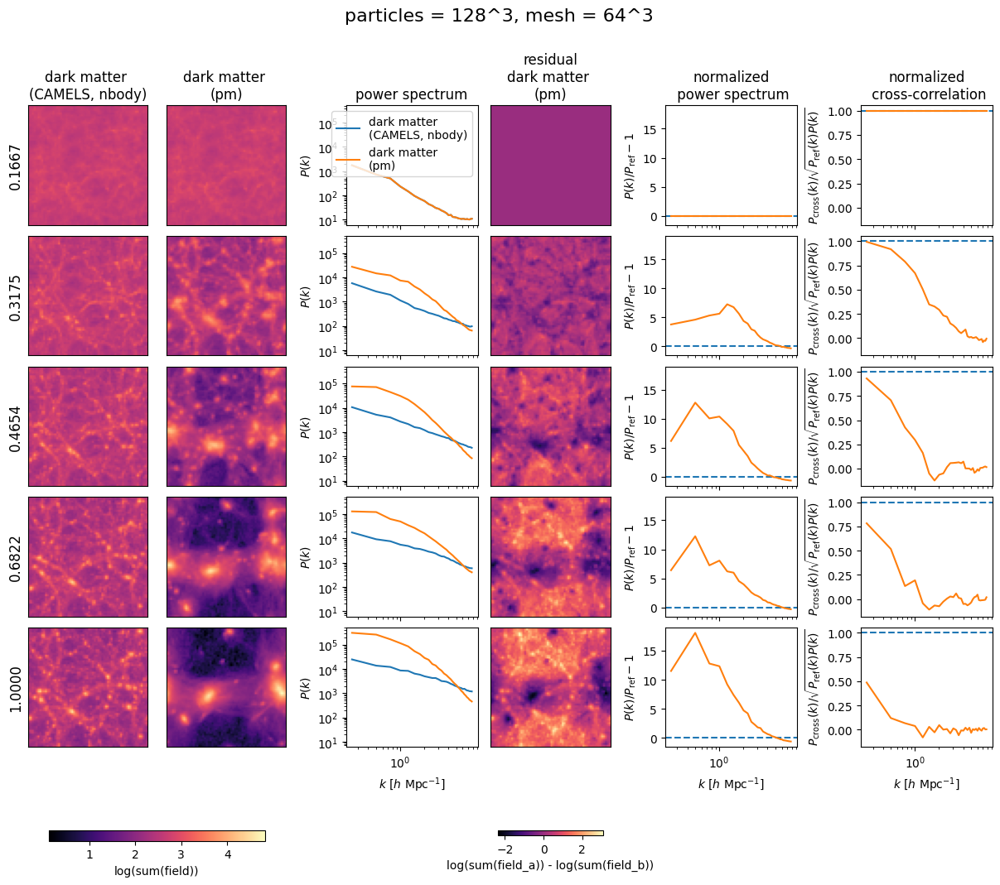

In [6]:
mesh_per_dim = 64
# for parts_per_dim in [64, 128]:
for parts_per_dim in [128]:
    mesh_shape = [mesh_per_dim] * 3
    
    if parts_per_dim == 256:
        parts_per_dim = None
    
    nbody_dict = camels.load_CV_snapshots(
        CV,
        mesh_per_dim,
        parts_per_dim,
        i_snapshots=i_snapshots,
        return_hydro=False
    )
    
    cosmo = nbody_dict["cosmo"]
    scales = nbody_dict["scales"]
    
    n_dm_poss = nbody_dict["dm_poss"]
    n_dm_vels = nbody_dict["dm_vels"]

    pm_ode = pm.make_ode_fn_diffrax(cosmo, mesh_shape)
    
    res = diffeqsolve(
            terms=ODETerm(pm_ode),
            solver=LeapfrogMidpoint(),
            t0=scales[0],
            t1=scales[-1],
            dt0=0.01,
            y0=jnp.stack([n_dm_poss[0], n_dm_vels[0]]),
            saveat=SaveAt(ts=scales),
            max_steps=100,
            stepsize_controller=ConstantStepSize(),
    )
    res = res.ys
    res = jnp.transpose(res, (1,0,2,3))
    
    pm_dm_poss, pm_dm_vels = res

    plotting.compare_particle_evolution(
        mesh_shape,
        scales,
        jnp.stack([n_dm_poss, pm_dm_poss], axis=0),
        include_pk=True,
        include_reference=True,
        # values
        shared_colorbar=True,
        # cosmetics
        title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
        col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(pm)"],
    )

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:17<00:00,  3.56s/it]


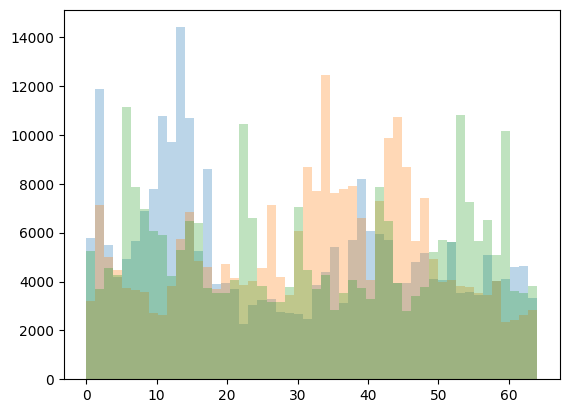

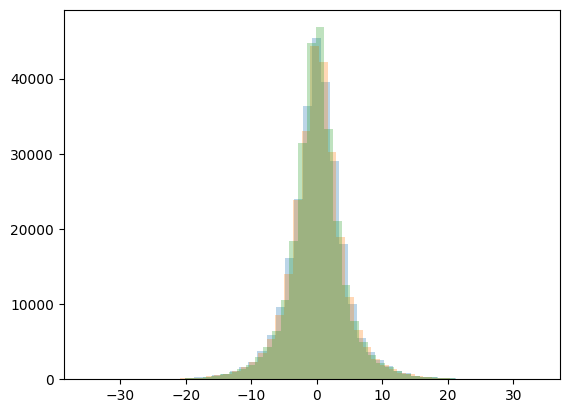

In [17]:
mesh_per_dim = 64
parts_per_dim = 64

nbody_dict = camels.load_CV_snapshots(
    CV,
    mesh_per_dim,
    parts_per_dim,
    i_snapshots=i_snapshots,
    return_hydro=False
)

cosmo = nbody_dict["cosmo"]
scales = nbody_dict["scales"]

n_dm_poss = nbody_dict["dm_poss"]
n_dm_vels = nbody_dict["dm_vels"]

i = -1

fig_pos, ax_pos = plt.subplots()
fig_vel, ax_vel = plt.subplots()
for j in range(3):
    ax_pos.hist(n_dm_poss[i,:,j], bins=50, alpha=0.3)
    ax_vel.hist(n_dm_vels[i,:,j], bins=50, alpha=0.3)

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:14<00:00,  2.85s/it]


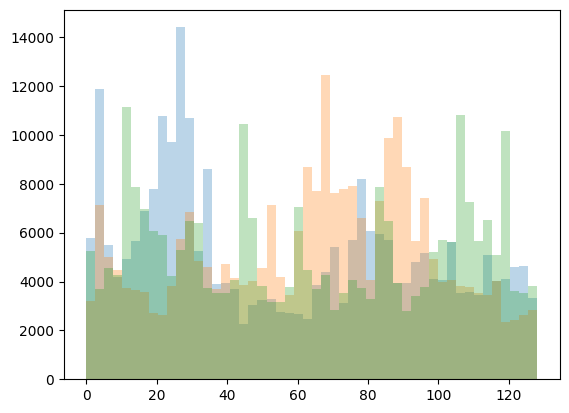

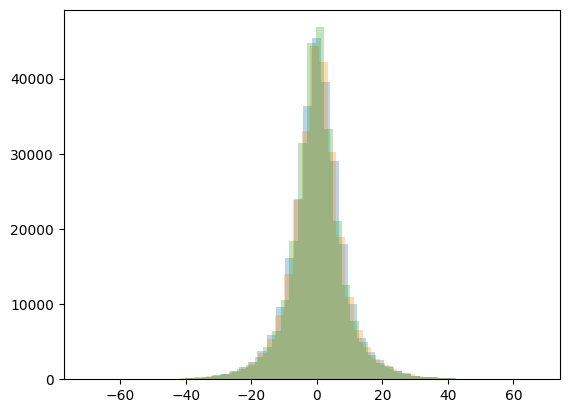

In [18]:
mesh_per_dim = 128
parts_per_dim = 64

nbody_dict = camels.load_CV_snapshots(
    CV,
    mesh_per_dim,
    parts_per_dim,
    i_snapshots=i_snapshots,
    return_hydro=False
)

cosmo = nbody_dict["cosmo"]
scales = nbody_dict["scales"]

n_dm_poss = nbody_dict["dm_poss"]
n_dm_vels = nbody_dict["dm_vels"]

i = -1

fig_pos, ax_pos = plt.subplots()
fig_vel, ax_vel = plt.subplots()
for j in range(3):
    ax_pos.hist(n_dm_poss[i,:,j], bins=50, alpha=0.3)
    ax_vel.hist(n_dm_vels[i,:,j], bins=50, alpha=0.3)

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:15<00:00,  3.01s/it]


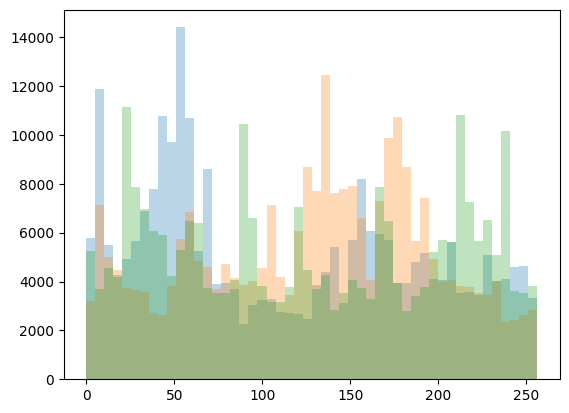

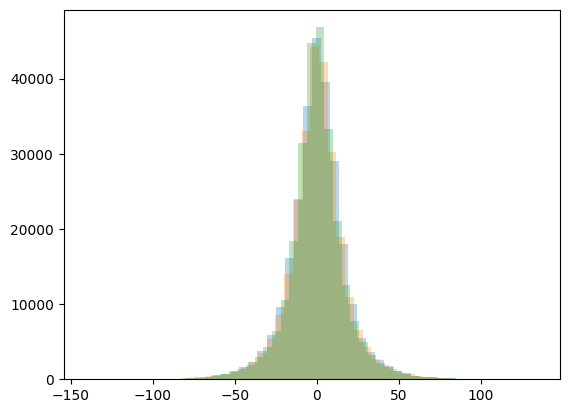

In [20]:
mesh_per_dim = 256
parts_per_dim = 64

nbody_dict = camels.load_CV_snapshots(
    CV,
    mesh_per_dim,
    parts_per_dim,
    i_snapshots=i_snapshots,
    return_hydro=False
)

cosmo = nbody_dict["cosmo"]
scales = nbody_dict["scales"]

n_dm_poss = nbody_dict["dm_poss"]
n_dm_vels = nbody_dict["dm_vels"]

i = -1

fig_pos, ax_pos = plt.subplots()
fig_vel, ax_vel = plt.subplots()
for j in range(3):
    ax_pos.hist(n_dm_poss[i,:,j], bins=50, alpha=0.3)
    ax_vel.hist(n_dm_vels[i,:,j], bins=50, alpha=0.3)

In [13]:
n_dm_poss.min(axis=1), n_dm_poss.max(axis=1)

(array([[2.39604487e-04, 1.00000007e-05, 2.99999985e-04],
        [2.99999992e-05, 6.36738318e-04, 7.90000020e-04],
        [4.19999997e-04, 4.67519538e-04, 1.41527341e-03],
        [6.72207039e-04, 4.03576669e-05, 1.79328129e-03],
        [1.41999999e-03, 1.18852535e-04, 9.49999958e-04]], dtype=float32),
 array([[127.99744, 127.99744, 127.99744],
        [127.99744, 127.99744, 127.99744],
        [127.99744, 127.99744, 127.99744],
        [127.99744, 127.99744, 127.99744],
        [127.99744, 127.99744, 127.99744]], dtype=float32))

In [11]:
n_dm_poss.shape

(5, 262144, 3)

In [43]:
parts_per_dim = 64
mesh_per_dim = 128
mesh_shape = [mesh_per_dim] * 3
        
nbody_dict = camels.load_CV_snapshots(
    CV,
    mesh_per_dim,
    parts_per_dim,
    i_snapshots=i_snapshots,
    return_hydro=False
)

cosmo = nbody_dict["cosmo"]
scales = nbody_dict["scales"]

n_dm_poss = nbody_dict["dm_poss"]
n_dm_vels = nbody_dict["dm_vels"]

Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:14<00:00,  2.95s/it]


100%|██████████| 5/5 [00:05<00:00,  1.19s/it]


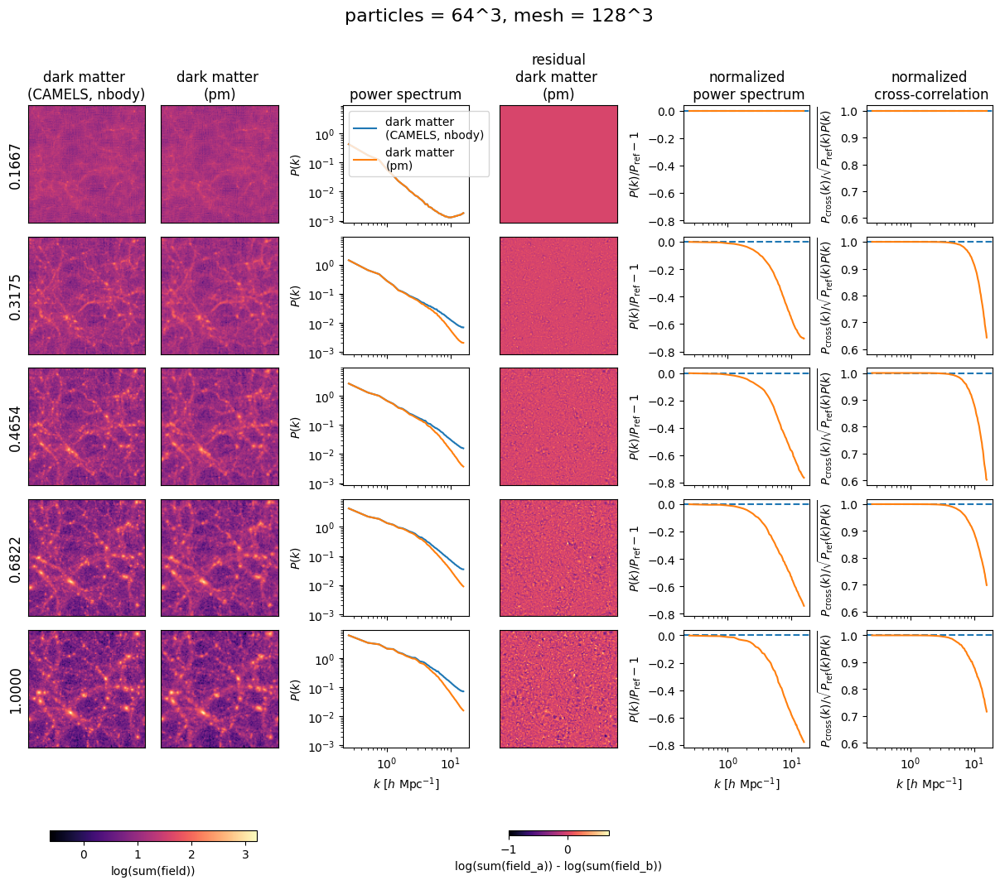

In [44]:
pm_ode = pm.make_ode_fn_diffrax(cosmo, mesh_shape)

res = diffeqsolve(
        terms=ODETerm(pm_ode),
        solver=LeapfrogMidpoint(),
        t0=scales[0],
        t1=scales[-1],
        dt0=0.01,
        y0=jnp.stack([n_dm_poss[0], n_dm_vels[0]]),
        saveat=SaveAt(ts=scales),
        max_steps=100,
        stepsize_controller=ConstantStepSize(),
)
res = res.ys
res = jnp.transpose(res, (1,0,2,3))

pm_dm_poss, pm_dm_vels = res

plotting.compare_particle_evolution(
    mesh_shape,
    scales,
    jnp.stack([n_dm_poss, pm_dm_poss], axis=0),
    include_pk=True,
    include_reference=True,
    # values
    shared_colorbar=True,
    # cosmetics
    title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
    col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(pm)"],
)


In [65]:
parts_per_dim, mesh_per_dim = 64, 128
mesh_shape = [mesh_per_dim] * 3

if parts_per_dim == 256:
    parts_per_dim = None

nbody_dict = camels.load_CV_snapshots(
    CV,
    mesh_per_dim,
    parts_per_dim,
    i_snapshots=i_snapshots,
    return_hydro=False
)

cosmo = nbody_dict["cosmo"]
scales = nbody_dict["scales"]

n_dm_poss = nbody_dict["dm_poss"]
n_dm_vels = nbody_dict["dm_vels"]



Using snapshots ['/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_018.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_042.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_058.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_074.hdf5', '/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/SIMBA_DM/CV/CV_0/snapshot_090.hdf5']
Selecting 262144 dark matter (deterministic)


loading snapshots: 100%|██████████| 5/5 [00:14<00:00,  2.84s/it]


100%|██████████| 5/5 [00:05<00:00,  1.18s/it]


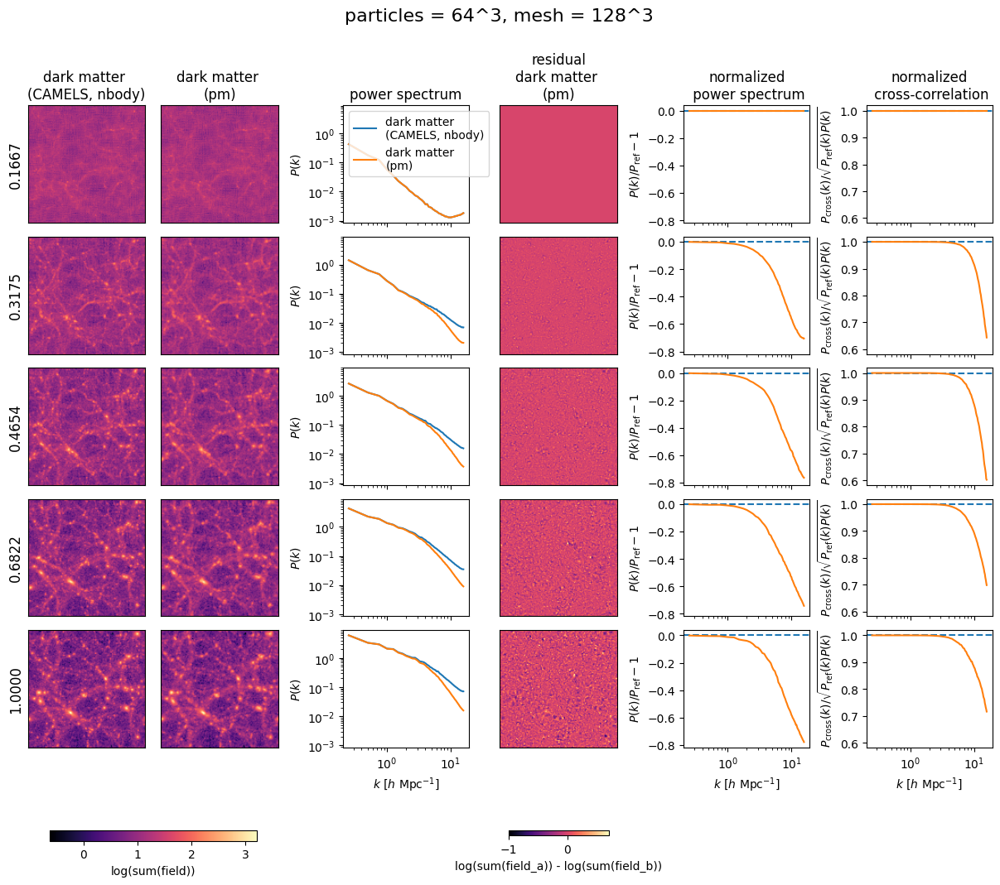

In [66]:
pm_ode = hpm.get_extended_hpm_network_ode_fn(
    cosmo, mesh_per_dim, parts_per_dim, dm_model=None, gas_model=None, integrator_type="diffrax"
)

res = diffeqsolve(
        terms=ODETerm(pm_ode),
        solver=LeapfrogMidpoint(),
        t0=scales[0],
        t1=scales[-1],
        dt0=0.01,
        y0=(n_dm_poss[0], n_dm_vels[0]),
        saveat=SaveAt(ts=scales),
        max_steps=100,
        stepsize_controller=ConstantStepSize(),
)
res = res.ys

pm_dm_poss, pm_dm_vels = res

plotting.compare_particle_evolution(
    mesh_shape,
    scales,
    jnp.stack([n_dm_poss, pm_dm_poss], axis=0),
    include_pk=True,
    include_reference=True,
    # values
    shared_colorbar=True,
    # cosmetics
    title=f"particles = {parts_per_dim}^3, mesh = {mesh_per_dim}^3",
    col_titles=["dark matter \n(CAMELS, nbody)", "dark matter \n(pm)"],
)